# Obesity Prediction Dataset

## About Dataset
This dataset helps estimate obesity levels based on eating habits, family history and physical condition. It includes data from individuals in Mexico, Peru, and Colombia, covering 16 lifestyle and health-related features with 2111 records. The labels classify obesity levels, ranging from underweight to different obesity types.

Most of the data was generated using synthetic techniques, while some were collected directly from users through a web platform. It is useful for classification, regression, and clustering tasks.

## Columns Description

Gender – Male or Female.

Age – The person’s age in years.

Height – Height in meters.

Weight – Weight in kilograms.

family_history_with_overweight – Whether the person has a family history of being overweight (yes/no).

FAVC – If the person frequently consumes high-calorie foods (yes/no).

FCVC – Frequency of vegetable consumption (scale from 1 to 3).
NCP – Number of main meals per day.

CAEC – Frequency of consuming food between meals (Never, Sometimes, Frequently, Always).

SMOKE – Whether the person smokes (yes/no).

CH2O – Daily water intake (scale from 1 to 3).

SCC – If the person monitors their calorie intake (yes/no).

FAF – Physical activity frequency (scale from 0 to 3).

TUE – Time spent using technology (scale from 0 to 3).

CALC – Frequency of alcohol consumption (Never, Sometimes, Frequently, Always).

MTRANS – Main mode of transportation (Automobile, Bike, Motorbike, Public Transportation, Walking).

NObeyesdad – Obesity level (Insufficient Weight, Normal Weight, Overweight Level I, Overweight Level II, Obesity Type I, Obesity Type II, Obesity Type III).

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.preprocessing import LabelEncoder

In [2]:
df = pd.read_csv('data/ObesityDataSet.csv')
df

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21,1.62,64.00,yes,no,2.0,3.0,Sometimes,no,2.00,no,0.00,1.000,no,Public_Transportation,Normal_Weight
1,Female,21,1.52,56.00,yes,no,3.0,3.0,Sometimes,yes,3.00,yes,3.00,0.000,Sometimes,Public_Transportation,Normal_Weight
2,Male,23,1.80,77.00,yes,no,2.0,3.0,Sometimes,no,2.00,no,2.00,1.000,Frequently,Public_Transportation,Normal_Weight
3,Male,27,1.80,87.00,no,no,3.0,3.0,Sometimes,no,2.00,no,2.00,0.000,Frequently,Walking,Overweight_Level_I
4,Male,22,1.78,89.80,no,no,2.0,1.0,Sometimes,no,2.00,no,0.00,0.000,Sometimes,Public_Transportation,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,Female,21,1.71,131.41,yes,yes,3.0,3.0,Sometimes,no,1.73,no,1.68,0.906,Sometimes,Public_Transportation,Obesity_Type_III
2107,Female,22,1.75,133.74,yes,yes,3.0,3.0,Sometimes,no,2.01,no,1.34,0.599,Sometimes,Public_Transportation,Obesity_Type_III
2108,Female,23,1.75,133.69,yes,yes,3.0,3.0,Sometimes,no,2.05,no,1.41,0.646,Sometimes,Public_Transportation,Obesity_Type_III
2109,Female,24,1.74,133.35,yes,yes,3.0,3.0,Sometimes,no,2.85,no,1.14,0.586,Sometimes,Public_Transportation,Obesity_Type_III


In [3]:
df.isnull().sum()

Gender                            0
Age                               0
Height                            0
Weight                            0
family_history_with_overweight    0
FAVC                              0
FCVC                              0
NCP                               0
CAEC                              0
SMOKE                             0
CH2O                              0
SCC                               0
FAF                               0
TUE                               0
CALC                              0
MTRANS                            0
NObeyesdad                        0
dtype: int64

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          2111 non-null   object 
 1   Age                             2111 non-null   int64  
 2   Height                          2111 non-null   float64
 3   Weight                          2111 non-null   float64
 4   family_history_with_overweight  2111 non-null   object 
 5   FAVC                            2111 non-null   object 
 6   FCVC                            2111 non-null   float64
 7   NCP                             2111 non-null   float64
 8   CAEC                            2111 non-null   object 
 9   SMOKE                           2111 non-null   object 
 10  CH2O                            2111 non-null   float64
 11  SCC                             2111 non-null   object 
 12  FAF                             21

In [5]:
df.columns

Index(['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
       'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
       'CALC', 'MTRANS', 'NObeyesdad'],
      dtype='object')

In [6]:
df.describe()

,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE
count,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000
mean,24.315964,1.701620,86.586035,2.418986,2.685651,2.008053,1.010313,0.657861
std,6.357078,0.093368,26.191163,0.533996,0.778079,0.612950,0.850613,0.608926
min,14.000000,1.450000,39.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,20.000000,1.630000,65.470000,2.000000,2.660000,1.585000,0.125000,0.000000
50%,23.000000,1.700000,83.000000,2.390000,3.000000,2.000000,1.000000,0.625000
75%,26.000000,1.770000,107.430000,3.000000,3.000000,2.480000,1.670000,1.000000
max,61.000000,1.980000,173.000000,3.000000,4.000000,3.000000,3.000000,2.000000


<Axes: xlabel='NObeyesdad'>

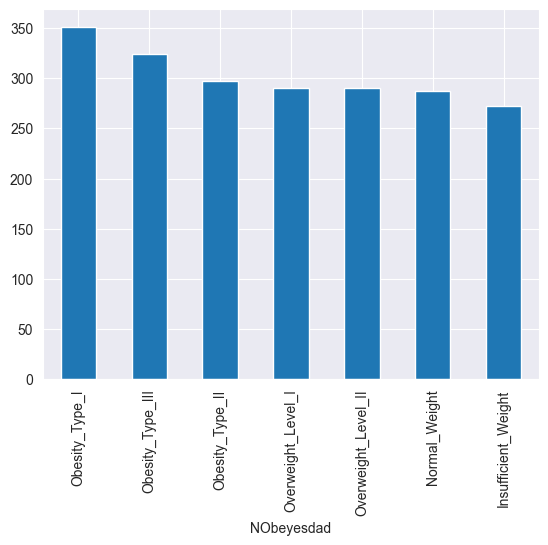

In [7]:
df['NObeyesdad'].value_counts().plot.bar()

## Data preparation

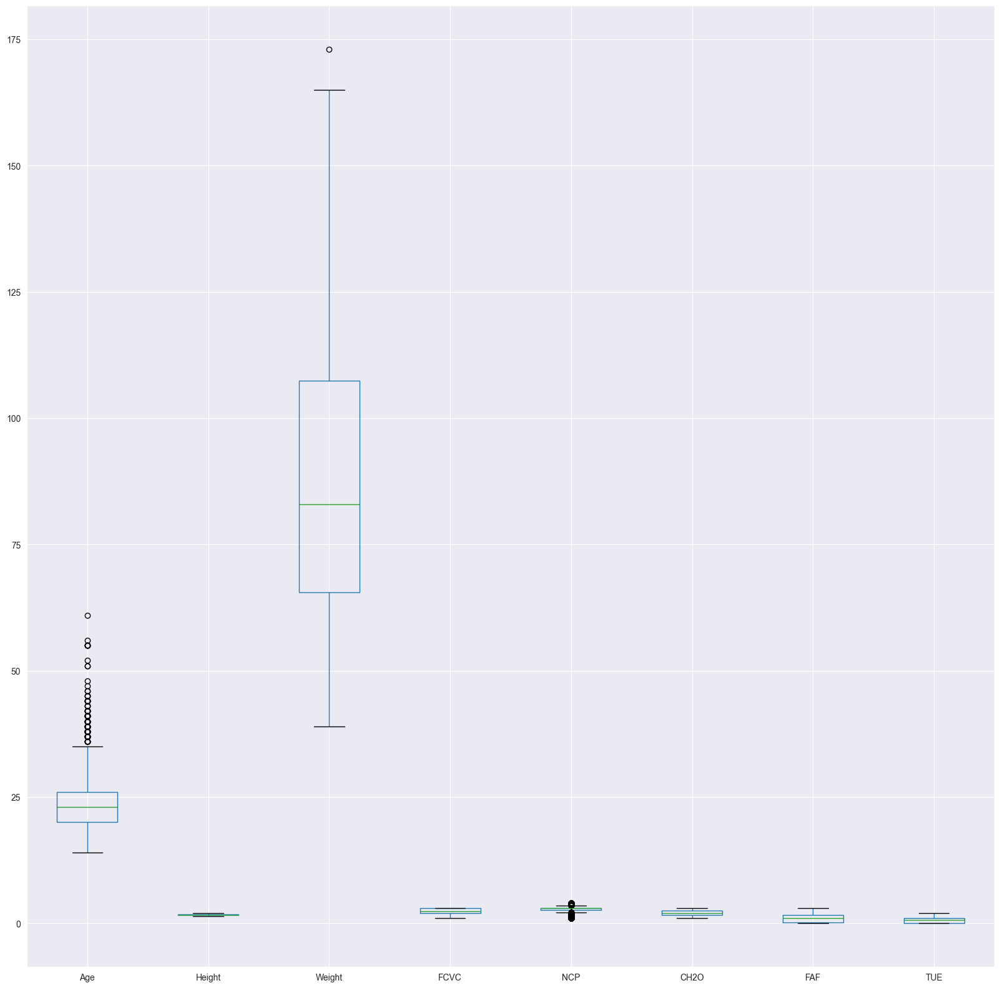

In [8]:
plt.figure(figsize=(20,20))
df.boxplot()
plt.show()

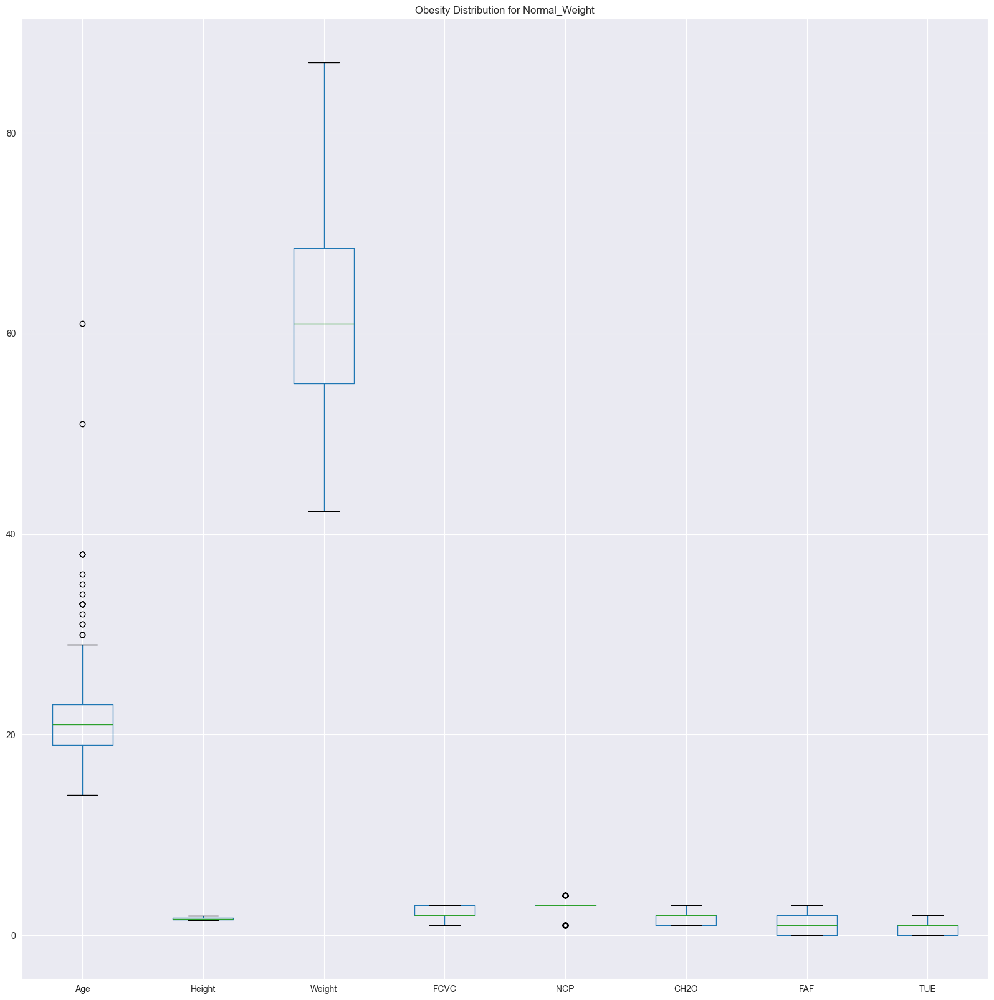

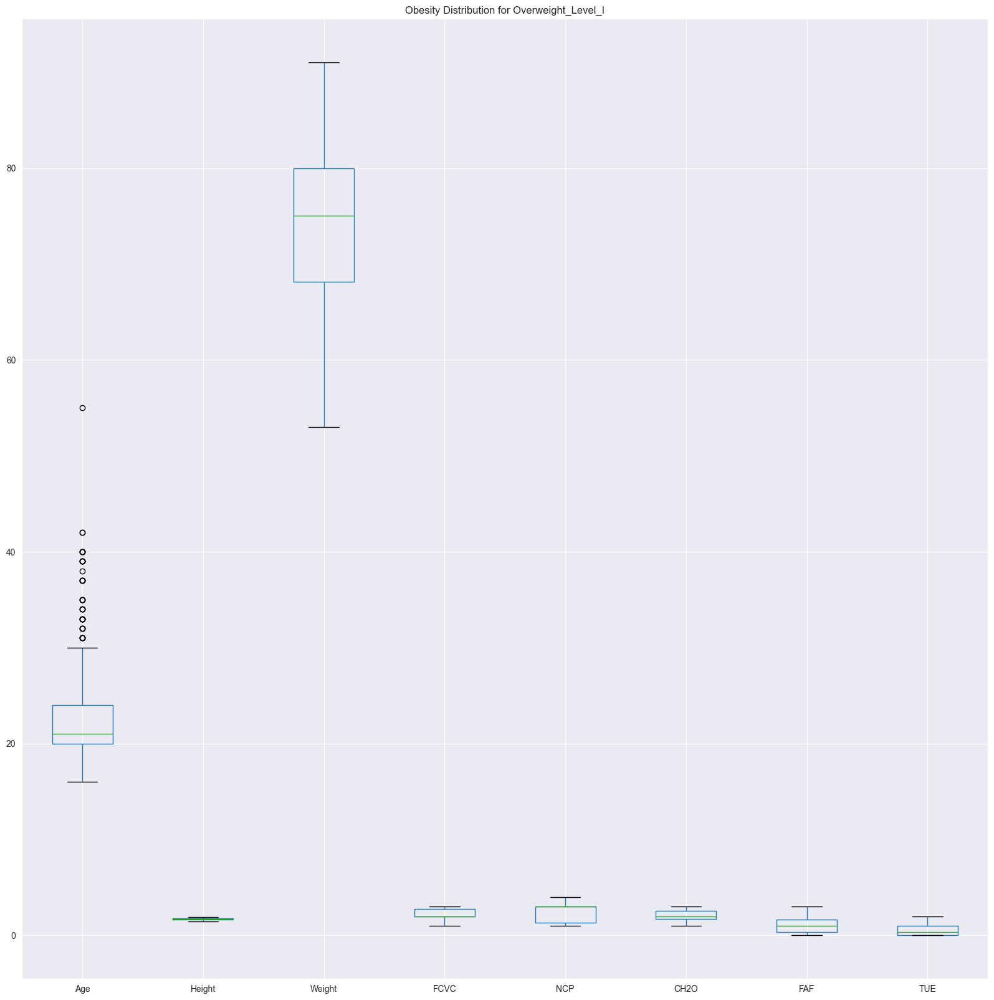

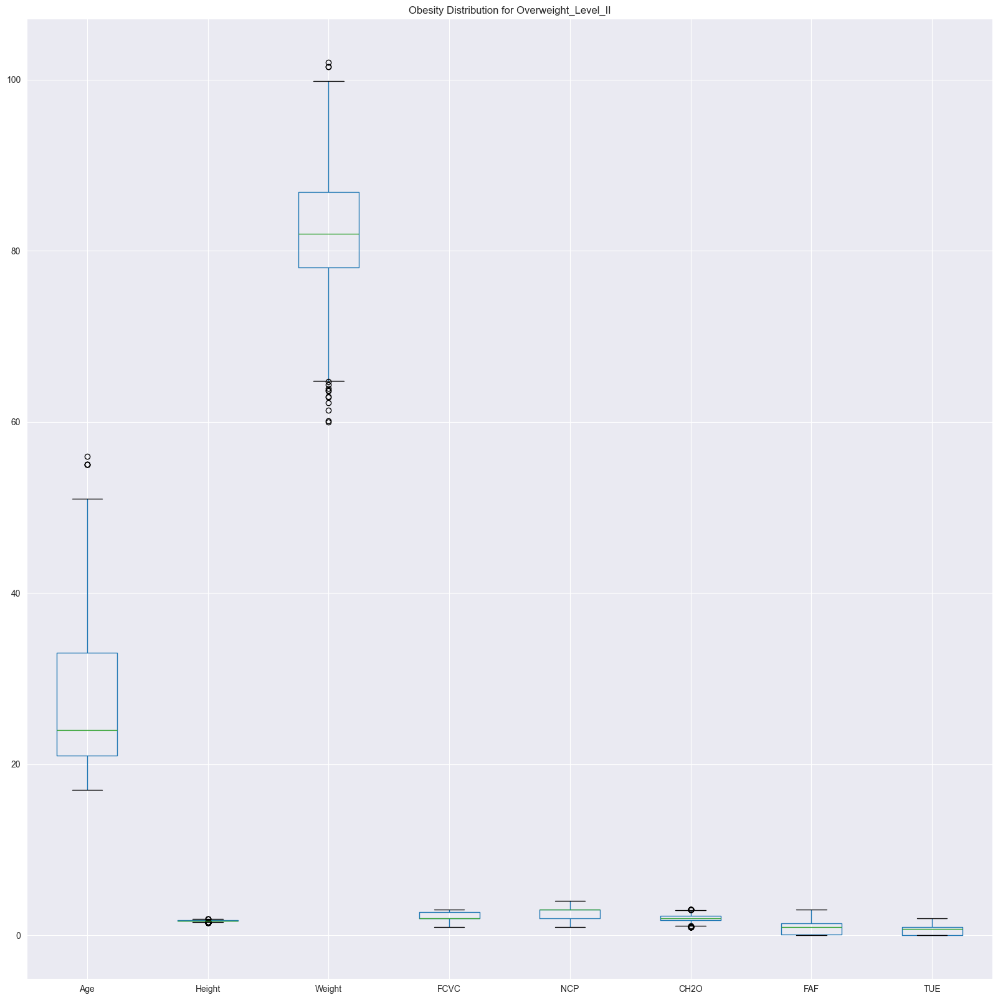

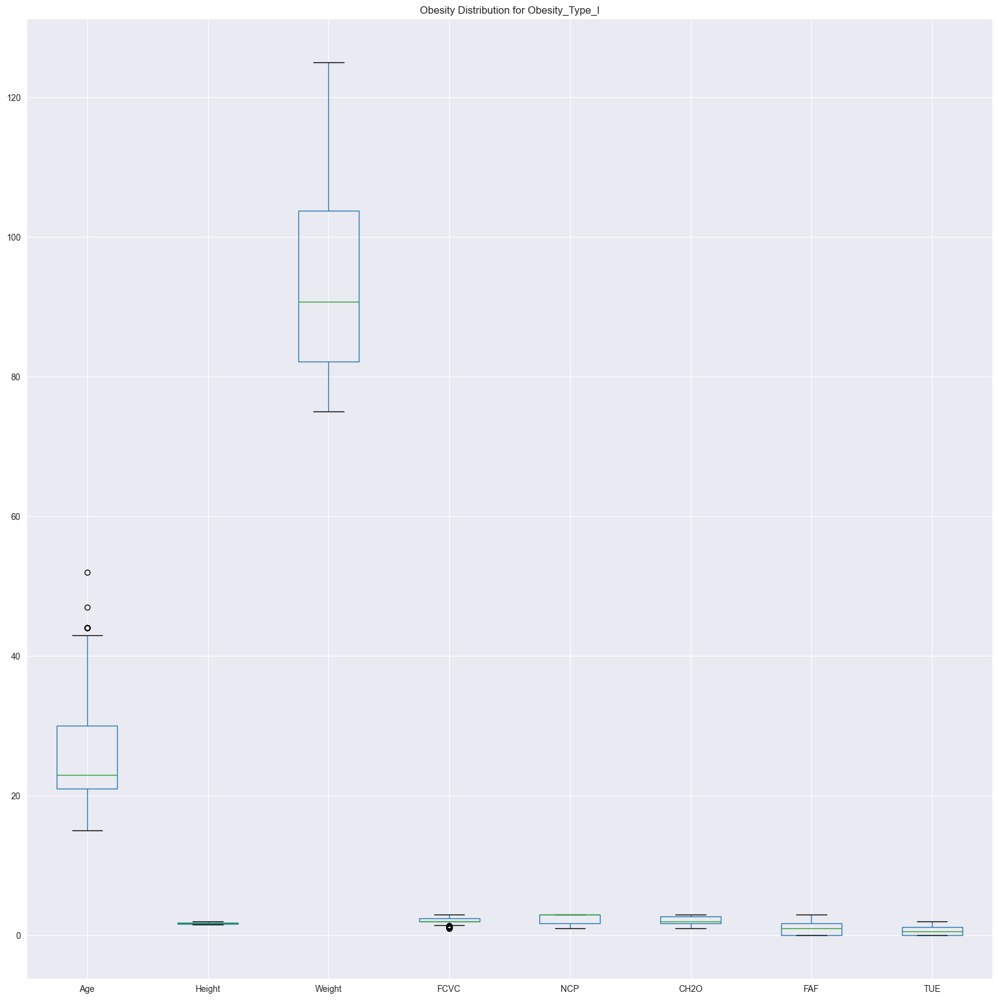

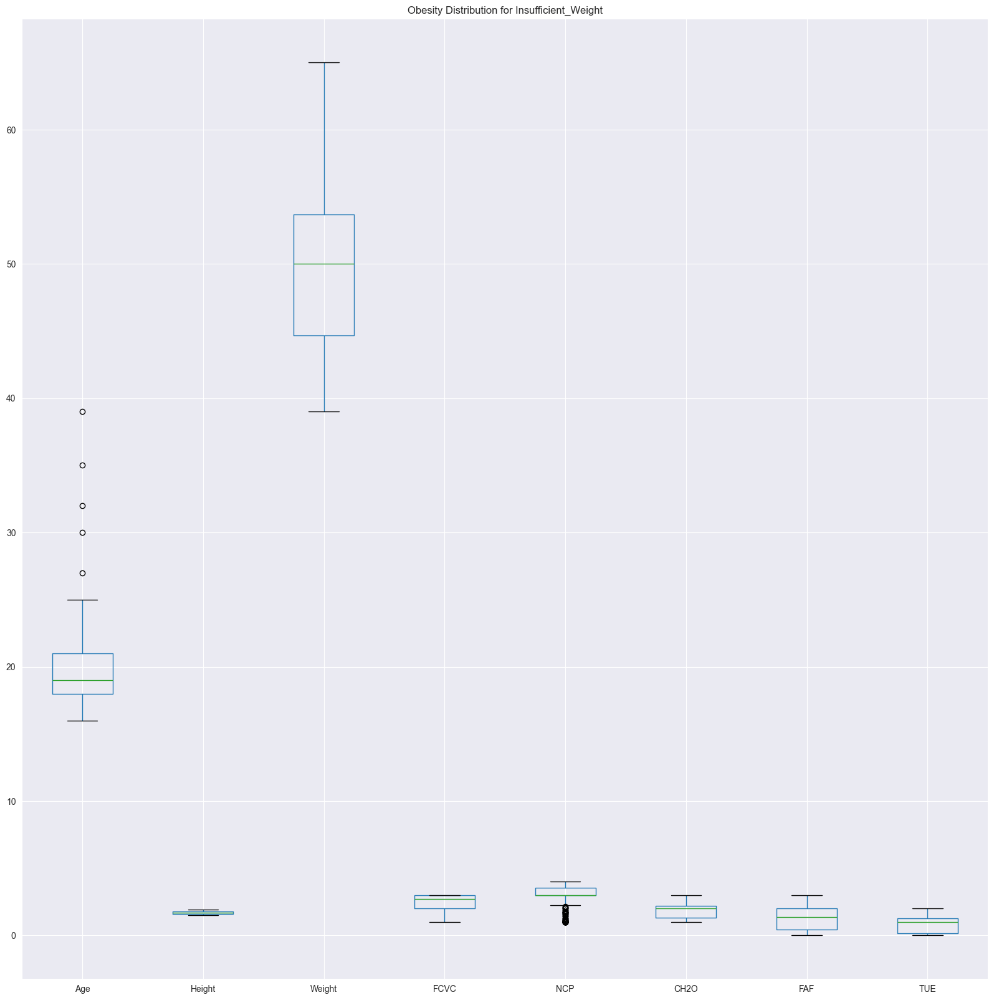

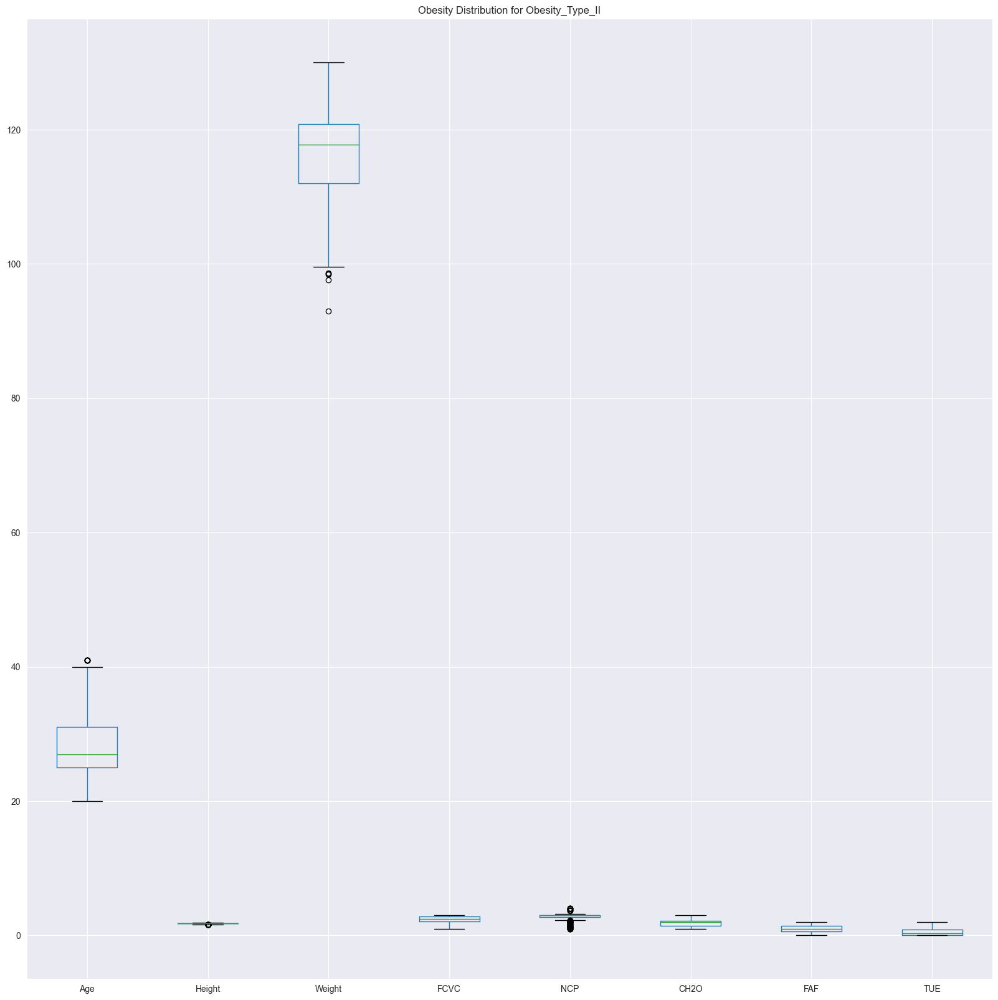

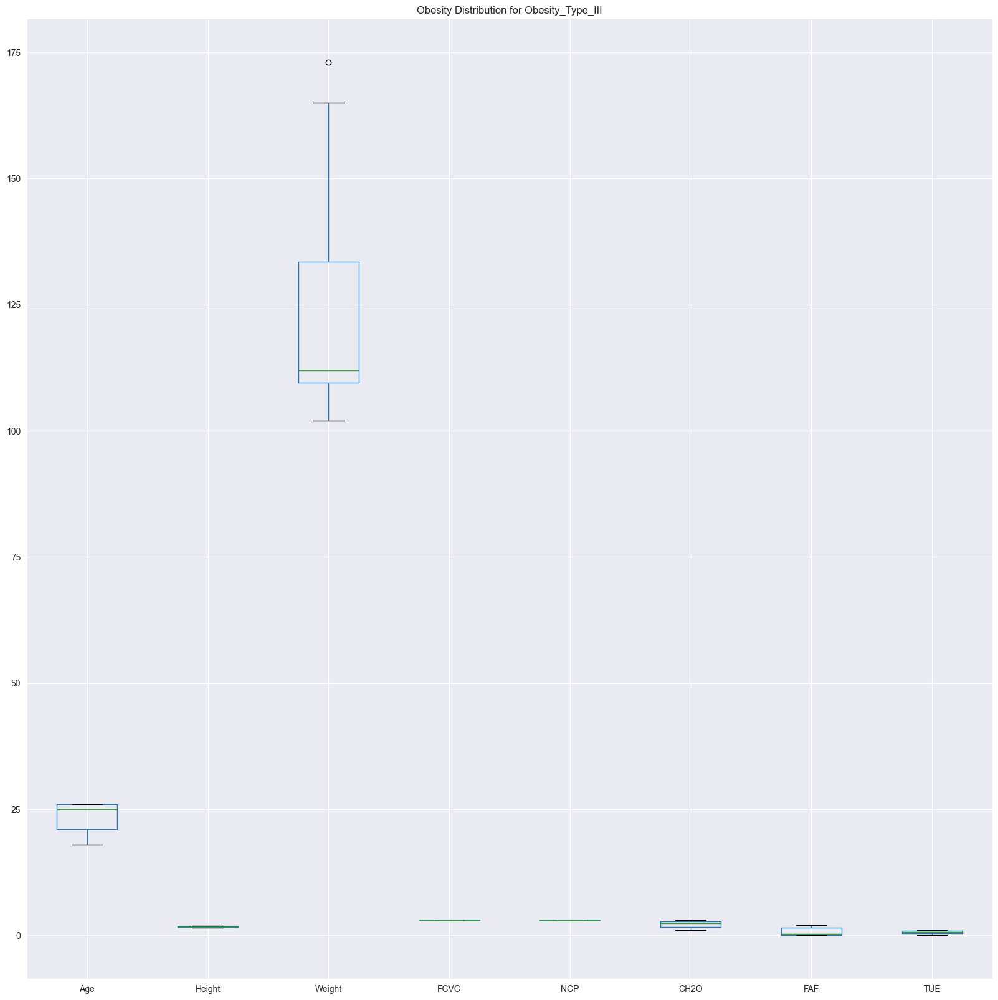

In [9]:
unique_class = df['NObeyesdad'].unique()
for i in unique_class:
    plt.figure(figsize=(20,20))
    df[df['NObeyesdad']==i].drop(columns='NObeyesdad',axis=1).boxplot()
    plt.title('Obesity Distribution for {}'.format(i))
    plt.show()

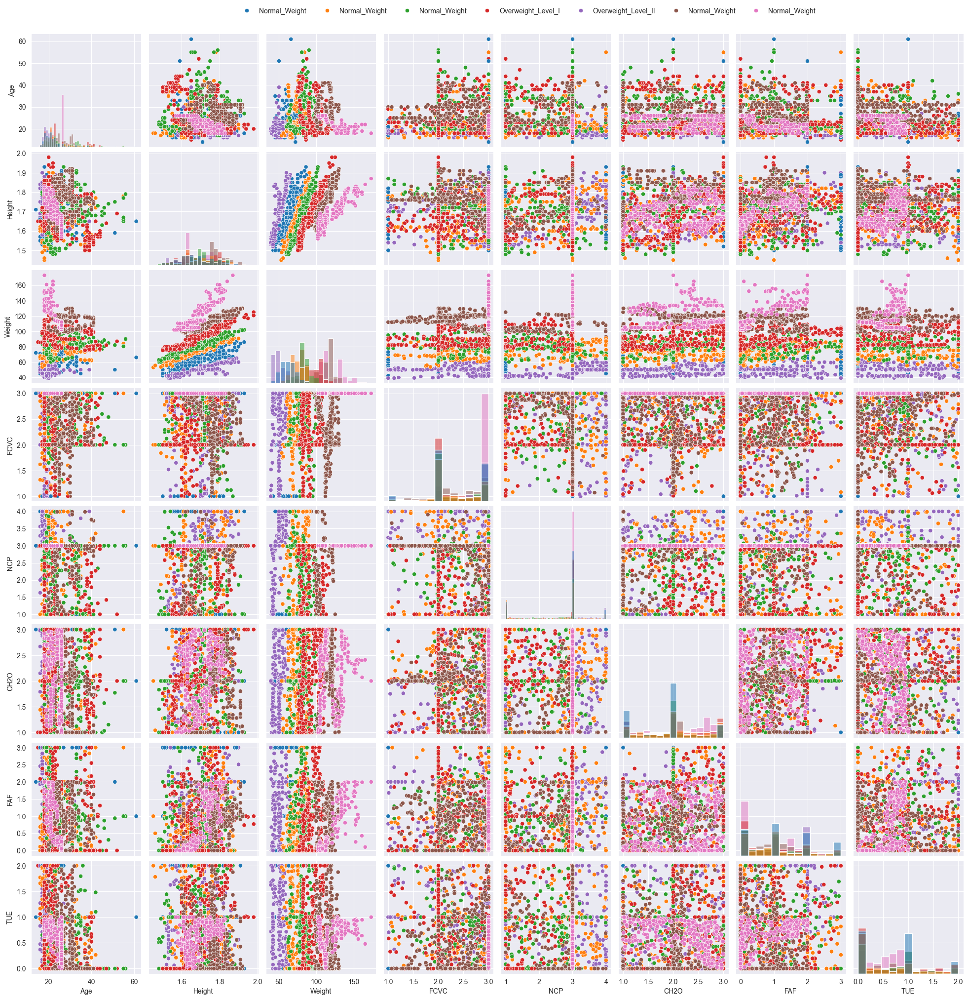

In [10]:
g=sns.pairplot(df, hue="NObeyesdad", diag_kind="hist")
sns.move_legend(g, "lower center",bbox_to_anchor=(.5, 1),ncol=7, title=None)
for t, l in zip(g._legend.texts, df['NObeyesdad']):
    t.set_text(l)

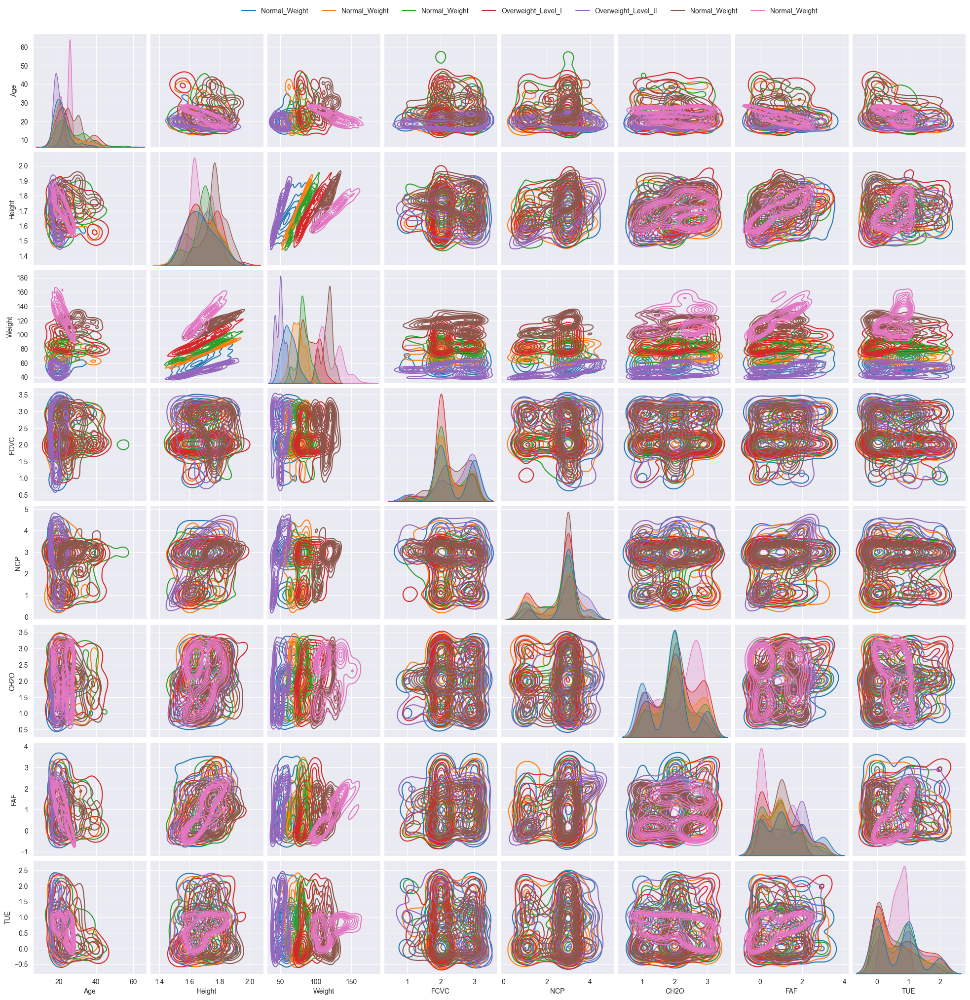

In [11]:
g=sns.pairplot(df, hue="NObeyesdad",kind="kde")
sns.move_legend(g, "lower center",bbox_to_anchor=(.5, 1),ncol=7, title=None)
for t, l in zip(g._legend.texts, df['NObeyesdad']):
    t.set_text(l)

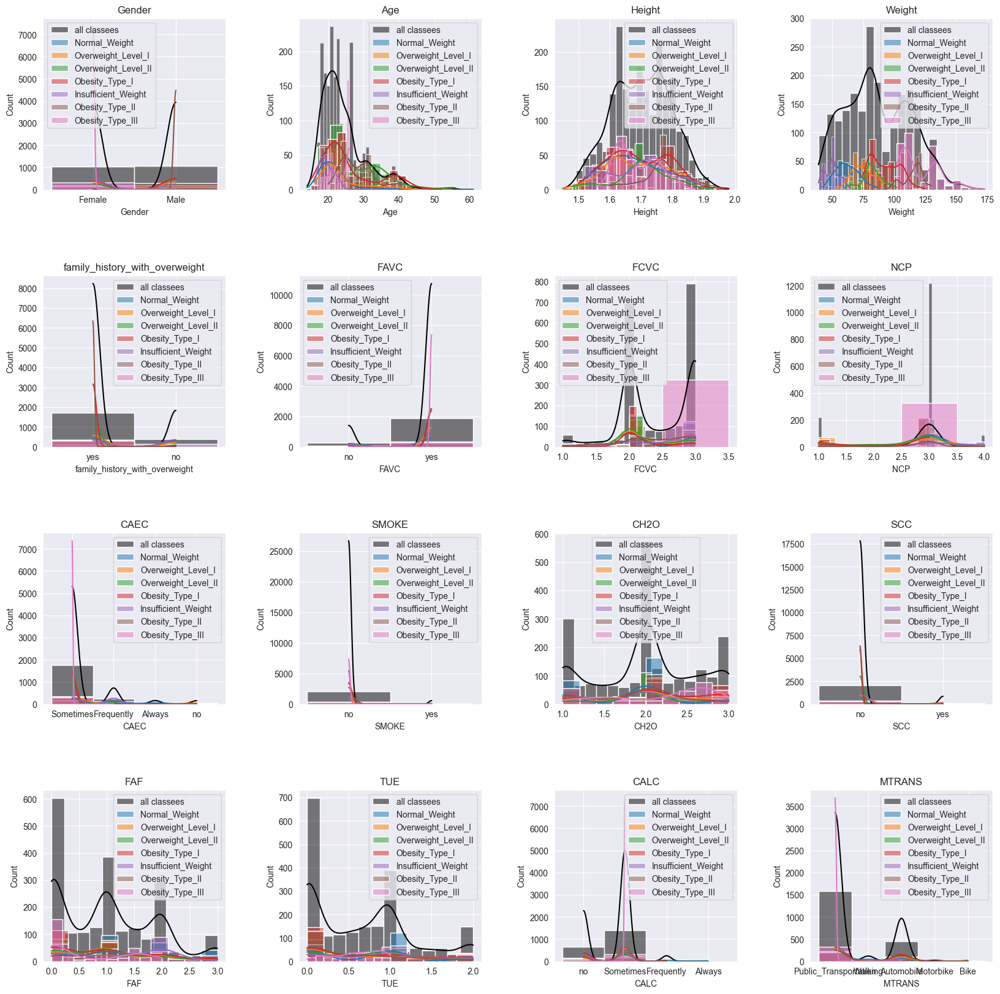

In [12]:
all_features = df.drop(columns=['NObeyesdad'],axis=1).columns
plt.figure(figsize=(20,20))
plt.subplots_adjust(hspace=0.5, wspace=0.4) 
n_features = len(all_features)
for f in range(n_features):
    ax = plt.subplot(4,4,f+1)
    plt.title(all_features[f])
    sns.histplot(df[all_features[f]],color='black',label='all classees',kde=True,stat="count") 
    for t in range(len(unique_class)): # се прикажува хистограм на вредностите на соодветниот атрибут за секоја класа посебно
        sns.histplot(df[df['NObeyesdad'] == unique_class[t]][all_features[f]], 
                 label=unique_class[t], kde=True, stat="count")
    plt.legend()
plt.show()

<Axes: >

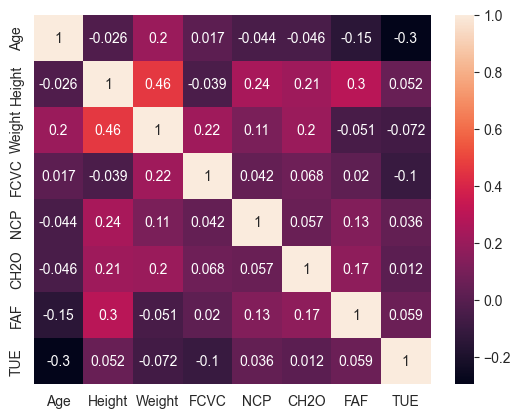

In [13]:
sns.heatmap(df[['Age', 'Height', 'Weight', 'FCVC', 'NCP','CH2O', 'FAF', 'TUE']].corr(),annot=True)

In [14]:
def label_encoder(df:pd.DataFrame,columns:list):
    for col in columns:
        encoder = LabelEncoder()
        hasUnknown = df[col].isnull().any()
        df[col] = encoder.fit_transform(df[col].astype(str))
        if hasUnknown:
            has_unknown = encoder.transform(["nan"])[0]
            df.loc[df[col] == has_unknown, col] = np.nan
    
    return df

In [15]:
df = label_encoder(df,['Gender','family_history_with_overweight','FAVC','CAEC', 'SMOKE','SCC','CALC', 'MTRANS', 'NObeyesdad'])
df

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,0,21,1.62,64.00,1,0,2.0,3.0,2,0,2.00,0,0.00,1.000,3,3,1
1,0,21,1.52,56.00,1,0,3.0,3.0,2,1,3.00,1,3.00,0.000,2,3,1
2,1,23,1.80,77.00,1,0,2.0,3.0,2,0,2.00,0,2.00,1.000,1,3,1
3,1,27,1.80,87.00,0,0,3.0,3.0,2,0,2.00,0,2.00,0.000,1,4,5
4,1,22,1.78,89.80,0,0,2.0,1.0,2,0,2.00,0,0.00,0.000,2,3,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,0,21,1.71,131.41,1,1,3.0,3.0,2,0,1.73,0,1.68,0.906,2,3,4
2107,0,22,1.75,133.74,1,1,3.0,3.0,2,0,2.01,0,1.34,0.599,2,3,4
2108,0,23,1.75,133.69,1,1,3.0,3.0,2,0,2.05,0,1.41,0.646,2,3,4
2109,0,24,1.74,133.35,1,1,3.0,3.0,2,0,2.85,0,1.14,0.586,2,3,4


## Train the model

In [16]:
X,y = df.drop(columns='NObeyesdad',axis=1), df['NObeyesdad']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

## Decision Tree 

In [17]:
model = DecisionTreeClassifier()
model.fit(X_train, y_train)

DecisionTreeClassifier()

In [18]:
pred = model.predict(X_test)
print('Classification Report')
print(classification_report(y_test, pred))

Classification Report
              precision    recall  f1-score   support

           0       0.97      0.94      0.95        65
           1       0.85      0.91      0.88        57
           2       0.98      0.97      0.98        67
           3       0.96      0.98      0.97        53
           4       1.00      1.00      1.00        69
           5       0.89      0.88      0.88        57
           6       0.96      0.95      0.95        55

    accuracy                           0.95       423
   macro avg       0.95      0.95      0.95       423
weighted avg       0.95      0.95      0.95       423



Confusion Matrix


<Axes: >

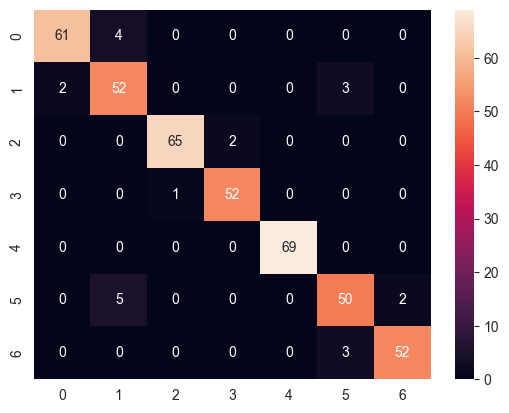

In [19]:
print('Confusion Matrix')
sns.heatmap(confusion_matrix(y_test, pred),annot=True)

## Desicion Tree with HyperParameters

In [20]:
params = {
    "max_depth":[3,4,5,6,7],
    "criterion":['gini','entropy'],
}
grid = GridSearchCV(DecisionTreeClassifier(), param_grid=params, cv=5)
grid.fit(X_train, y_train)
print(grid.best_params_)

{'criterion': 'entropy', 'max_depth': 7}


In [21]:
best_model = DecisionTreeClassifier(**grid.best_params_)
best_model.fit(X_train, y_train)
y_pred = best_model.predict(X_test)
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.97      0.94      0.95        65
           1       0.85      0.82      0.84        57
           2       0.97      0.93      0.95        67
           3       1.00      0.98      0.99        53
           4       0.97      1.00      0.99        69
           5       0.83      0.88      0.85        57
           6       0.90      0.95      0.92        55

    accuracy                           0.93       423
   macro avg       0.93      0.93      0.93       423
weighted avg       0.93      0.93      0.93       423

